In [1]:
import pandas as pd
from rdkit import Chem
import seaborn as sns
from tqdm import tqdm
import numpy as np

In [2]:
tqdm.pandas()


# PubChem AID 	884

## Assay info

The P450 gene superfamily is involved in the metabolism and clearance of xenobiotics. This assay used human CYP3A4 to measure the dealkylation of luciferin-6' phenylpiperazinylyl (Luciferin-PPXE; luciferin detection buffer) to luciferin. The luciferin is then measured by luminescence after the addition of a luciferase detection reagent. Luciferin-PPXE concentration in the assay was equal to its KM for CYP3A4. Inhibitors and some substrates limit the production of luciferin, and decrease measured luminescence.



In [3]:
df = pd.read_csv("PubChem_AID_884/AID_884_datatable_all.csv")

In [4]:
list(df.columns)

['PUBCHEM_RESULT_TAG',
 'PUBCHEM_SID',
 'PUBCHEM_CID',
 'PUBCHEM_EXT_DATASOURCE_SMILES',
 'PUBCHEM_ACTIVITY_OUTCOME',
 'PUBCHEM_ACTIVITY_SCORE',
 'PUBCHEM_ACTIVITY_URL',
 'PUBCHEM_ASSAYDATA_COMMENT',
 'Phenotype',
 'Potency',
 'Efficacy',
 'Analysis Comment',
 'Curve_Description',
 'Fit_LogAC50',
 'Fit_HillSlope',
 'Fit_R2',
 'Fit_InfiniteActivity',
 'Fit_ZeroActivity',
 'Fit_CurveClass',
 'Excluded_Points',
 'Max_Response',
 'Activity at 0.0007317399 uM',
 'Activity at 0.00164 uM',
 'Activity at 0.00366 uM',
 'Activity at 0.00370 uM',
 'Activity at 0.00818 uM',
 'Activity at 0.018 uM',
 'Activity at 0.041 uM',
 'Activity at 0.091 uM',
 'Activity at 0.092 uM',
 'Activity at 0.204 uM',
 'Activity at 0.457 uM',
 'Activity at 1.022 uM',
 'Activity at 2.286 uM',
 'Activity at 5.111 uM',
 'Activity at 11.43 uM',
 'Activity at 25.56 uM',
 'Activity at 57.14 uM',
 'Compound QC']

In [8]:
# first 5 rows are metadata 
df[0:5]

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.092 uM,Activity at 0.204 uM,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.111 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC
0,RESULT_TYPE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,STRING,FLOAT,...,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,FLOAT,STRING
1,RESULT_DESCR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Indicates type of activity observed: inhibitor...,Concentration at which compound exhibits half-...,...,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,% Activity at given concentration.,"NCGC designation for data stage: 'qHTS', 'qHTS..."
2,RESULT_UNIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MICROMOLAR,...,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,PERCENT,NaN
3,RESULT_IS_ACTIVE_CONCENTRATION,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TRUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,RESULT_ATTR_CONC_MICROMOL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0915,0.204484,0.4572,1.02236,2.286,5.11148,11.4293,25.5558,57.1429,NaN


In [9]:
    df = df.drop(labels=list(range(0, 5)), axis=0).reset_index(
        drop=True
    )

In [10]:
df.head(10)

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.092 uM,Activity at 0.204 uM,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.111 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC
0,1,11112150.0,135398658.0,C1=CC(=CC=C1C(=O)N[C@@H](CCC(=O)O)C(=O)O)NCC2=...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,NaN,-7.7044,-8.5541,-3.412,-13.7863,-11.5527,-11.5848,-24.5753,NaN,QC'd by Prestwick
1,2,4253520.0,266698.0,C1CCC(C1)(C#N)NC2=CC=C(C=C2)C3=CC=C(C=C3)NC4(C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,NaN,NaN,-10.2459,NaN,-15.3279,NaN,-20.898,NaN,NaN,QC'd by NCI
2,3,4239835.0,3234942.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Active,84.0,NaN,NaN,Inhibitor,3.1623,...,NaN,NaN,-4.1883,NaN,-22.1195,NaN,-100.465,NaN,-76.6849,QC'd by Pharmacopeia
3,4,4238700.0,3233809.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Inconclusive,20.0,NaN,NaN,Inhibitor,3.1623,...,NaN,NaN,-5.1287,NaN,-13.2802,NaN,-32.7135,NaN,-21.7708,QC'd by Pharmacopeia
4,5,17389122.0,6348.0,C(=S)=S,Inactive,0.0,NaN,NaN,Inactive,NaN,...,NaN,-4.8184,-5.5248,-6.4547,-4.3686,6.2253,-5.41,-9.4048,-10.8373,QC'd by NIEHS/NTP
5,6,11110820.0,2457.0,C1CN=C(N1)C2=NC3=CC=CC=C3C=C2,Inconclusive,21.0,NaN,NaN,Inhibitor,12.5893,...,4.3082,NaN,-4.3362,NaN,-6.0292,NaN,-20.9396,NaN,-36.1171,QC'd by SigmaAldrich
6,7,4253384.0,443657.0,C[C@@H]([C@@H](C(=O)O)N)OP(=O)(O)O,Inactive,0.0,NaN,NaN,Inactive,NaN,...,NaN,NaN,-9.1011,NaN,-9.8495,NaN,-9.7879,NaN,NaN,QC'd by NCI
7,8,26749608.0,16758032.0,C(C1C(C(C([C@@H](O1)OC2C(C(O[C@@]2(CO)O[C@H]3C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,NaN,NaN,-2.9101,NaN,-9.6068,NaN,-11.084,NaN,-13.2481,QC'd by Microsource
8,9,4237862.0,3232975.0,CC1=CN=C(C=N1)CNC2=NC=NC(=C2)C3=CC=C(C=C3)N(C)C,Active,42.0,NaN,NaN,Inhibitor,10,...,NaN,NaN,-3.346,NaN,-2.2385,NaN,-40.4391,NaN,-70.1974,QC'd by Pharmacopeia
9,10,17384877.0,3247264.0,C[C@H]([C@@H]1C[C@@]1(C)[C@H](C2=CC=CC=C2)NC(=...,Active,85.0,NaN,NaN,Inhibitor,2.5119,...,NaN,NaN,-13.3911,NaN,-52.6073,NaN,-86.5544,NaN,-100.69,QC'd by UPCMLD


In [11]:
df.columns

Index(['PUBCHEM_RESULT_TAG', 'PUBCHEM_SID', 'PUBCHEM_CID',
       'PUBCHEM_EXT_DATASOURCE_SMILES', 'PUBCHEM_ACTIVITY_OUTCOME',
       'PUBCHEM_ACTIVITY_SCORE', 'PUBCHEM_ACTIVITY_URL',
       'PUBCHEM_ASSAYDATA_COMMENT', 'Phenotype', 'Potency', 'Efficacy',
       'Analysis Comment', 'Curve_Description', 'Fit_LogAC50', 'Fit_HillSlope',
       'Fit_R2', 'Fit_InfiniteActivity', 'Fit_ZeroActivity', 'Fit_CurveClass',
       'Excluded_Points', 'Max_Response', 'Activity at 0.0007317399 uM',
       'Activity at 0.00164 uM', 'Activity at 0.00366 uM',
       'Activity at 0.00370 uM', 'Activity at 0.00818 uM',
       'Activity at 0.018 uM', 'Activity at 0.041 uM', 'Activity at 0.091 uM',
       'Activity at 0.092 uM', 'Activity at 0.204 uM', 'Activity at 0.457 uM',
       'Activity at 1.022 uM', 'Activity at 2.286 uM', 'Activity at 5.111 uM',
       'Activity at 11.43 uM', 'Activity at 25.56 uM', 'Activity at 57.14 uM',
       'Compound QC'],
      dtype='object')

In [12]:
# lets look at activity

<Axes: xlabel='Phenotype', ylabel='Count'>

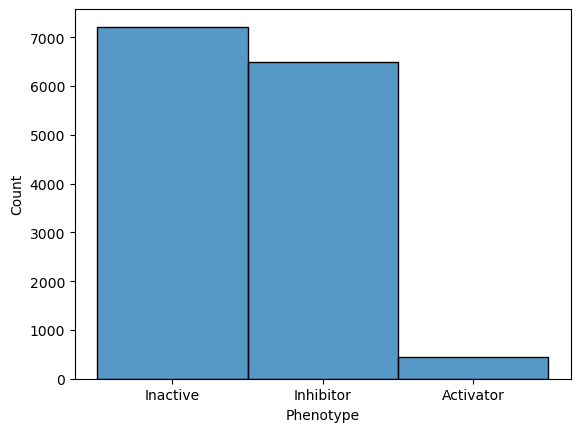

In [16]:
sns.histplot(data=df, x="Phenotype")

<Axes: xlabel='PUBCHEM_ACTIVITY_OUTCOME', ylabel='Count'>

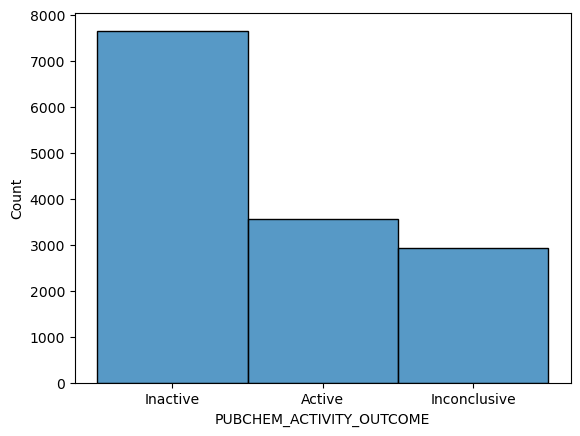

In [17]:
sns.histplot(data=df, x="PUBCHEM_ACTIVITY_OUTCOME")

In [18]:
import matplotlib.pyplot as plt

In [19]:
df["PUBCHEM_ACTIVITY_SCORE"]

0         0.0
1         0.0
2        84.0
3        20.0
4         0.0
         ... 
14150    20.0
14151    86.0
14152    88.0
14153    22.0
14154    20.0
Name: PUBCHEM_ACTIVITY_SCORE, Length: 14155, dtype: float64

In [20]:
mol_col = "PUBCHEM_EXT_DATASOURCE_SMILES"
mol_id_cols = ["PUBCHEM_SID", "PUBCHEM_CID"]

In [21]:
len(df)

14155

In [22]:
df = df.dropna(subset="PUBCHEM_SID")

In [23]:
len(df)

14155

In [24]:
df["PUBCHEM_SID"] = df["PUBCHEM_SID"].astype(int)
# df["PUBCHEM_CID"] = df["PUBCHEM_CID"].astype(int)

In [25]:
# standardisation of SMILES
from rdkit import Chem
from rdkit.Chem.MolStandardize import rdMolStandardize
from rdkit.rdBase import BlockLogs
import mols2grid

In [26]:

# from Pat Walters method
def standardize_smiles(smiles):
    try:
        # follows the steps in
        # https://github.com/greglandrum/RSC_OpenScience_Standardization_202104/blob/main/MolStandardize%20pieces.ipynb
        # as described **excellently** (by Greg) in
        # https://www.youtube.com/watch?v=eWTApNX8dJQ
        mol = Chem.MolFromSmiles(smiles)
    
        # removeHs, disconnect metal atoms, normalize the molecule, reionize the molecule
        clean_mol = rdMolStandardize.Cleanup(mol)
    
        # if many fragments, get the "parent" (the actual mol we are interested in) 
        parent_clean_mol = rdMolStandardize.FragmentParent(clean_mol)
    
        # try to neutralize molecule
        uncharger = rdMolStandardize.Uncharger()  # annoying, but necessary as no convenience method exists
        uncharged_parent_clean_mol = uncharger.uncharge(parent_clean_mol)
    
        # note that no attempt is made at reionization at this step
        # nor at ionization at some pH (rdkit has no pKa caculator)
        # the main aim to represent all molecules from different sources
        # in a (single) standard way, for use in ML, catalogue, etc.
    
        te = rdMolStandardize.TautomerEnumerator()  # idem
        taut_uncharged_parent_clean_mol = te.Canonicalize(uncharged_parent_clean_mol)
    
        return Chem.MolToSmiles(taut_uncharged_parent_clean_mol)
    except:
        return pd.NA

In [27]:

with BlockLogs():
    df["CANONICAL_SMILES"] = df[mol_col].progress_apply(lambda x: standardize_smiles(x))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14155/14155 [02:00<00:00, 117.10it/s]


In [28]:
def smi_to_inchikey(smiles):
    try:
        mol = Chem.MolFromSmiles(smiles)
        return Chem.MolToInchiKey(mol)
    except:
        return pd.NA

In [29]:
# compute inchikeys
with BlockLogs():
    df["INCHIKEY"] = df["CANONICAL_SMILES"].progress_apply(lambda x: smi_to_inchikey(x))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14155/14155 [00:03<00:00, 4100.08it/s]


In [30]:
df.INCHIKEY.isna().sum() # there are a few that couldn't be standardised

np.int64(46)

In [31]:
df.dropna(subset="INCHIKEY")

,PUBCHEM_RESULT_TAG,PUBCHEM_SID,PUBCHEM_CID,PUBCHEM_EXT_DATASOURCE_SMILES,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_ACTIVITY_SCORE,PUBCHEM_ACTIVITY_URL,PUBCHEM_ASSAYDATA_COMMENT,Phenotype,Potency,...,Activity at 0.457 uM,Activity at 1.022 uM,Activity at 2.286 uM,Activity at 5.111 uM,Activity at 11.43 uM,Activity at 25.56 uM,Activity at 57.14 uM,Compound QC,CANONICAL_SMILES,INCHIKEY
0,1,11112150,135398658.0,C1=CC(=CC=C1C(=O)N[C@@H](CCC(=O)O)C(=O)O)NCC2=...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-8.5541,-3.412,-13.7863,-11.5527,-11.5848,-24.5753,NaN,QC'd by Prestwick,Nc1nc(=O)c2nc(CNc3ccc(C(=O)NC(CCC(=O)O)C(=O)O)...,OVBPIULPVIDEAO-UHFFFAOYSA-N
1,2,4253520,266698.0,C1CCC(C1)(C#N)NC2=CC=C(C=C2)C3=CC=C(C=C3)NC4(C...,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-10.2459,NaN,-15.3279,NaN,-20.898,NaN,NaN,QC'd by NCI,N#CC1(Nc2ccc(-c3ccc(NC4(C#N)CCCC4)cc3)cc2)CCCC1,DBCCRWIMQOCVFV-UHFFFAOYSA-N
2,3,4239835,3234942.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Active,84.0,NaN,NaN,Inhibitor,3.1623,...,-4.1883,NaN,-22.1195,NaN,-100.465,NaN,-76.6849,QC'd by Pharmacopeia,COc1ccc(-c2nc3cnc(OC)nc3n(Cc3ccc(F)cc3)c2=O)cc1,LSZNTYYDGMZAQA-UHFFFAOYSA-N
3,4,4238700,3233809.0,COC1=CC=C(C=C1)C2=NC3=CN=C(N=C3N(C2=O)CC4=CC=C...,Inconclusive,20.0,NaN,NaN,Inhibitor,3.1623,...,-5.1287,NaN,-13.2802,NaN,-32.7135,NaN,-21.7708,QC'd by Pharmacopeia,COc1ccc(Oc2ncc3nc(-c4ccc(OC)cc4)c(=O)n(Cc4cccs...,LBAKXHHDYSUDNL-UHFFFAOYSA-N
4,5,17389122,6348.0,C(=S)=S,Inactive,0.0,NaN,NaN,Inactive,NaN,...,-5.5248,-6.4547,-4.3686,6.2253,-5.41,-9.4048,-10.8373,QC'd by NIEHS/NTP,S=C=S,QGJOPFRUJISHPQ-UHFFFAOYSA-N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14150,14151,26749942,4412068.0,COC1=C(C=C2C(=CC(=O)OC2=C1OC)C3=CC=CC=C3)O,Inconclusive,20.0,NaN,NaN,Inhibitor,31.6228,...,-1.5394,NaN,-4.8043,NaN,-8.9293,NaN,-40.6646,QC'd by Microsource,COc1c(O)cc2c(-c3ccccc3)cc(=O)oc2c1OC,ABUBCBFUQXIEAU-UHFFFAOYSA-N
14151,14152,26748798,312915.0,CCN(CC)CCOC(=O)C(CC1CCCO1)CC2=CC=CC3=CC=CC=C32...,Active,86.0,NaN,NaN,Inhibitor,1,...,-39.8099,NaN,-62.2531,NaN,-71.5328,NaN,-81.8361,QC'd by Microsource,CCN(CC)CCOC(=O)C(Cc1cccc2ccccc12)CC1CCCO1,KBAFPSLPKGSANY-UHFFFAOYSA-N
14152,14153,17385265,3247182.0,CN(C)C(=O)C1=CC2=C(N1CCC3=CC=CC=N3)C[C@@H]4[C@...,Active,88.0,NaN,NaN,Inhibitor,0.7943,...,-51.1608,NaN,-87.9181,NaN,-98.0106,NaN,-102.485,QC'd by UPCMLD,COC(=O)[C@@]1(Cc2ccc(F)cc2)[C@H]2c3cc(C(=O)N(C...,KLPQGUOKRRAJCQ-ARROIKNCSA-N
14153,14154,26751069,16758503.0,C/C(=N\O[C@H]1[C@@H]([C@H]([C@H]([C@H](O1)COC(...,Inconclusive,22.0,NaN,NaN,Inhibitor,5.0119,...,-8.8189,NaN,-16.3069,NaN,-41.6105,NaN,NaN,QC'd by BUCMLD,CC(=O)OC[C@H]1O[C@@H](O/N=C(\C)CCN2CCc3nc(-c4c...,WGCFLVZYYXDOOX-ZCCVPCTFSA-N


In [32]:
# lets gather up the activities?

In [33]:
# ok, clean up DF, and segement into active and inactives,

In [34]:
keep_cols = ["CANONICAL_SMILES", "INCHIKEY", "PUBCHEM_ACTIVITY_OUTCOME", "PUBCHEM_CID"]

In [35]:
clean = df[keep_cols]

In [36]:
clean["dataset"] = "aid884"
clean["data_type"] = "assay"

/tmp/ipykernel_160448/3482997245.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["dataset"] = "aid884"
/tmp/ipykernel_160448/3482997245.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["data_type"] = "assay"


In [37]:
clean["active"] = clean["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"

/tmp/ipykernel_160448/212178452.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["active"] = clean["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"


In [38]:
mols2grid.display(clean, smiles_col="CANONICAL_SMILES")

MolGridWidget()

In [39]:
clean.head()
clean["common_name"] = pd.NA
clean["action_type"] = "inhibitor"
clean["active"] = clean["PUBCHEM_ACTIVITY_OUTCOME"] == "Active"

/tmp/ipykernel_160448/831850103.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["common_name"] = pd.NA
/tmp/ipykernel_160448/831850103.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean["action_type"] = "inhibitor"
/tmp/ipykernel_160448/831850103.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

In [40]:
clean.to_csv("./processed/AID_884.csv", index=False)

In [34]:
# spot checked structures with a few pubchem CIDs, looks like translation went ok